In [ ]:
!pip install tensorflow==2.13.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.7/479.7 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 28.8 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.12.2
    Uninstalling typing_extensions-4.12.2:
      Successfully uninstalled typing_extensions-4.12.2
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: gast
    Found existing installation: gast 0.6.0
    Uninstalling gast-0.6.0:
      

In [1]:
import os

# Chemin vers le répertoire cible
Target_path = "/content/drive/MyDrive/Colab Notebooks/data1 (2)/images"

# Fonction pour compter les fichiers d'image dans un répertoire
def count_images_in_directory(directory, valid_extensions=['.jpg', '.jpeg', '.png']):
    count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                count += 1
    return count

# Compter les images dans le répertoire cible
total_images_count = count_images_in_directory(Target_path)
print(f"Nombre total d'images dans '{Target_path}' : {total_images_count}")


Nombre total d'images dans '/content/drive/MyDrive/Colab Notebooks/data1 (2)/images' : 3436


In [2]:
# Obtenir la liste des sous-répertoires (classes)
class_dirs = [os.path.join(Target_path, class_name) for class_name in os.listdir(Target_path)
              if os.path.isdir(os.path.join(Target_path, class_name))]

# Compter les images pour chaque classe
for class_dir in class_dirs:
    class_name = os.path.basename(class_dir)
    class_image_count = count_images_in_directory(class_dir)
    print(f"Nombre d'images pour la classe '{class_name}' : {class_image_count}")


Nombre d'images pour la classe 'engaged' : 1962
Nombre d'images pour la classe 'not engaged' : 1474


In [3]:
import cv2
import os

def is_blurry(image_path, threshold=100):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return False
    laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
    return laplacian_var < threshold

def check_image_quality(directory, resolution_threshold=(100, 100)):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                # Check resolution
                image = cv2.imread(file_path)
                if image is None:
                    print(f"Image non chargée: {file_path}")
                    continue

                height, width, _ = image.shape
                if height < resolution_threshold[0] or width < resolution_threshold[1]:
                    print(f"Image avec résolution insuffisante: {file_path} ({width}x{height})")

                # Check blurriness
                if is_blurry(file_path):
                    print(f"Image floue détectée: {file_path}")

# Chemin vers le répertoire des images
check_image_quality(Target_path)


In [4]:
def count_blurry_images(directory, threshold=100):
    blurry_count = 0
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    blurry_count += 1
                    print(f"Image floue détectée: {file_path}")
    return blurry_count

# Chemin vers le répertoire des images
blurry_image_count = count_blurry_images(Target_path)
print(f"Nombre total d'images floues : {blurry_image_count}")


Nombre total d'images floues : 0


In [5]:
from PIL import Image, ImageFilter
import os

def sharpen_image(image_path):
    image = Image.open(image_path)
    sharpened_image = image.filter(ImageFilter.SHARPEN)
    return sharpened_image

def process_blurry_images(directory, threshold=100):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    print(f"Amélioration de l'image floue: {file_path}")
                    sharpened_image = sharpen_image(file_path)
                    sharpened_image.save(file_path)  # Remplacez l'image originale par l'image améliorée

# Chemin vers le répertoire des images
process_blurry_images(Target_path)


In [6]:
def count_blurry_images_after_enhancement(directory, threshold=100):
    blurry_count = 0
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    blurry_count += 1
                    print(f"Image toujours floue détectée après amélioration: {file_path}")
    return blurry_count

# Compter les images floues après l'amélioration
blurry_image_count_after = count_blurry_images_after_enhancement(Target_path)
print(f"Nombre total d'images toujours floues après amélioration : {blurry_image_count_after}")


Nombre total d'images toujours floues après amélioration : 0


In [3]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

# Chemin vers le répertoire principal contenant vos images classées
data_dir = "/content/drive/MyDrive/Colab Notebooks/data1 (2)/images"

# Dictionnaire pour stocker les chemins d'images par classe
data = {'class_names': [], 'image_paths': []}

# Parcourir les classes et collecter les chemins des images
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        image_paths = [os.path.join(class_dir, img) for img in os.listdir(class_dir)]
        data['class_names'].extend([class_name] * len(image_paths))
        data['image_paths'].extend(image_paths)

# Convertir les listes en tableaux NumPy pour faciliter le split
class_names = np.array(data['class_names'])
image_paths = np.array(data['image_paths'])

# Diviser les données en ensembles d'entraînement, de validation et de test
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths, class_names, train_size=0.7, random_state=42, stratify=class_names
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels, train_size=0.5, random_state=42, stratify=temp_labels
)

# Exemples d'utilisation des ensembles split :
# Utilisez train_paths, val_paths, test_paths dans votre modèle

print(f"Nombre d'images pour l'entraînement: {len(train_paths)}")
print(f"Nombre d'images pour la validation: {len(val_paths)}")
print(f"Nombre d'images pour le test: {len(test_paths)}")

Nombre d'images pour l'entraînement: 2405
Nombre d'images pour la validation: 515
Nombre d'images pour le test: 516


In [4]:
from collections import Counter

# Chemin vers le répertoire principal contenant vos images classées


# Comptage des images par classe pour chaque ensemble
def count_images_by_class(labels):
    return dict(Counter(labels))

# Comptage des images par classe
train_counts = count_images_by_class(train_labels)
val_counts = count_images_by_class(val_labels)
test_counts = count_images_by_class(test_labels)

# Afficher les résultats
print("Comptage des images par classe:")
print("Ensemble d'entraînement:", train_counts)
print("Ensemble de validation:", val_counts)
print("Ensemble de test:", test_counts)


Comptage des images par classe:
Ensemble d'entraînement: {'not engaged': 1032, 'engaged': 1373}
Ensemble de validation: {'engaged': 294, 'not engaged': 221}
Ensemble de test: {'engaged': 295, 'not engaged': 221}


In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Prétraitement des images pour générer preprocced_image_paths
preprocced_image_paths = [path.replace("data2", "preprocessed_data2") for path in data['image_paths']]

# Création des variables pour l'analyse
labels = np.array(data['class_names'])
image_paths = np.array(data['image_paths'])


/content/drive/MyDrive/Colab Notebooks/data1 (2)/images/not engaged/181729_NOTR_frame0.jpg
/content/drive/MyDrive/Colab Notebooks/data1 (2)/images/not engaged/181729_NOTR_frame0.jpg
         label                                              image  \
0  not engaged  /content/drive/MyDrive/Colab Notebooks/data1 (...   
1      engaged  /content/drive/MyDrive/Colab Notebooks/data1 (...   
2  not engaged  /content/drive/MyDrive/Colab Notebooks/data1 (...   
3  not engaged  /content/drive/MyDrive/Colab Notebooks/data1 (...   
4  not engaged  /content/drive/MyDrive/Colab Notebooks/data1 (...   

                                   preproccesd_image  
0  /content/drive/MyDrive/Colab Notebooks/data1 (...  
1  /content/drive/MyDrive/Colab Notebooks/data1 (...  
2  /content/drive/MyDrive/Colab Notebooks/data1 (...  
3  /content/drive/MyDrive/Colab Notebooks/data1 (...  
4  /content/drive/MyDrive/Colab Notebooks/data1 (...  
Distribution des classes pour l'ensemble Ensemble Complet :
label
engaged

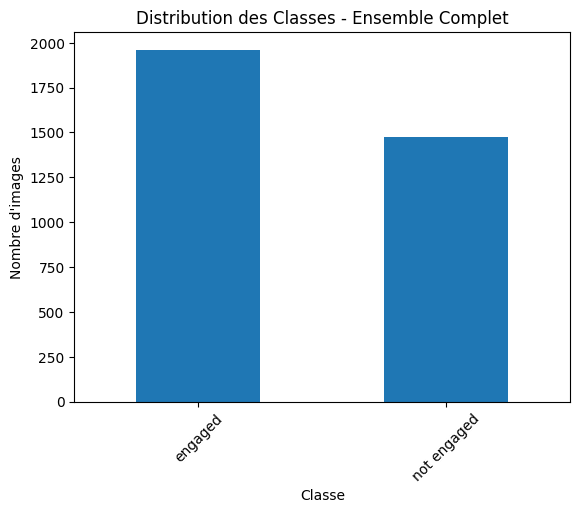

In [6]:
# Ajustement des listes pour qu'elles aient la même longueur
min_length = min(len(labels), len(image_paths), len(preprocced_image_paths))
labels = labels[:min_length]
image_paths = image_paths[:min_length]
preprocced_image_paths = preprocced_image_paths[:min_length]

# Création du DataFrame
dataset = pd.DataFrame()
dataset["label"] = labels
dataset["image"] = image_paths
dataset["preproccesd_image"] = preprocced_image_paths

# Mélange du DataFrame et réinitialisation des index
dataset = dataset.sample(frac=1).reset_index(drop=True)

# Affichage de certains éléments pour vérification
print(dataset["image"][3])
print(dataset['preproccesd_image'][3])

# Affichage des premières lignes du DataFrame
print(dataset.head())

# Vérification de la distribution des classes
def check_class_distribution(df, set_name):
    print(f"Distribution des classes pour l'ensemble {set_name} :")
    distribution = df['label'].value_counts()
    print(distribution)
    print("-" * 40)
    return distribution

# Vérifiez la distribution des classes
distribution = check_class_distribution(dataset, 'Ensemble Complet')

# Visualisation de la distribution
def plot_distribution(distribution, title):
    distribution.plot(kind='bar')
    plt.title(title)
    plt.xlabel('Classe')
    plt.ylabel('Nombre d\'images')
    plt.xticks(rotation=45)
    plt.show()

# Visualiser la distribution
plot_distribution(distribution, 'Distribution des Classes - Ensemble Complet')


<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


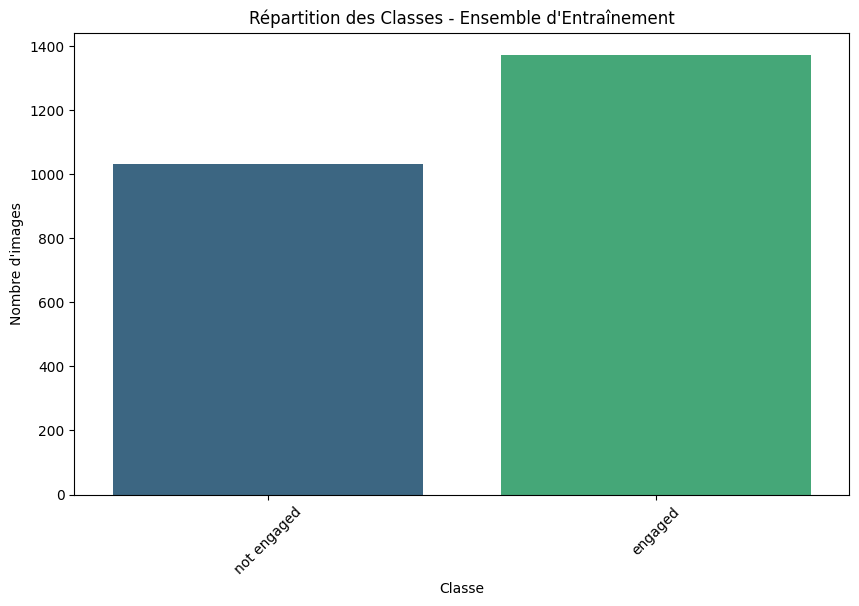

<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


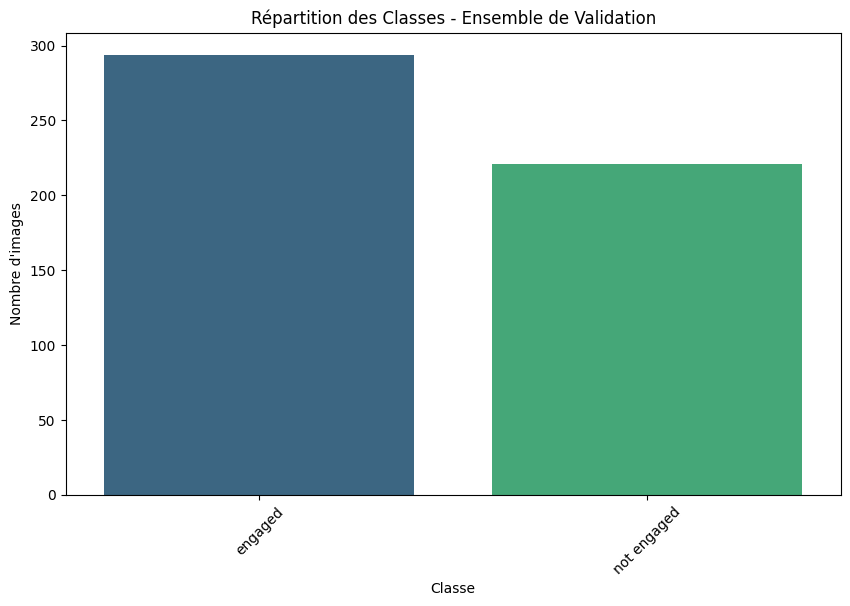

<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


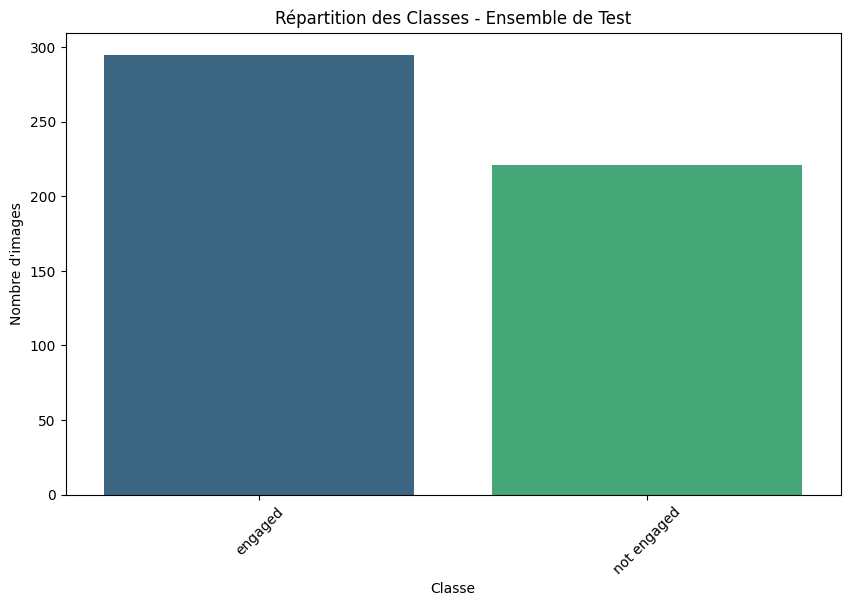

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Fonction pour visualiser la répartition des classes
def plot_class_distribution(counts, title):
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')
    plt.title(title)
    plt.xlabel('Classe')
    plt.ylabel('Nombre d\'images')
    plt.xticks(rotation=45)
    plt.show()

# Visualiser la répartition des classes dans chaque ensemble
plot_class_distribution(train_counts, 'Répartition des Classes - Ensemble d\'Entraînement')
plot_class_distribution(val_counts, 'Répartition des Classes - Ensemble de Validation')
plot_class_distribution(test_counts, 'Répartition des Classes - Ensemble de Test')


In [8]:
dataset = pd.DataFrame()
dataset["label"],dataset["image"],dataset['preproccesd_image']= labels,image_paths,preprocced_image_paths
dataset = dataset.sample(frac=1).reset_index(drop=True)
print(dataset["image"][3])
print(dataset['preproccesd_image'][3])
dataset.head()

/content/drive/MyDrive/Colab Notebooks/data1 (2)/images/engaged/182131_SOF_frame42.jpg
/content/drive/MyDrive/Colab Notebooks/data1 (2)/images/engaged/182131_SOF_frame42.jpg


,label,image,preproccesd_image
0,not engaged,/content/drive/MyDrive/Colab Notebooks/data1 (...,/content/drive/MyDrive/Colab Notebooks/data1 (...
1,engaged,/content/drive/MyDrive/Colab Notebooks/data1 (...,/content/drive/MyDrive/Colab Notebooks/data1 (...
2,engaged,/content/drive/MyDrive/Colab Notebooks/data1 (...,/content/drive/MyDrive/Colab Notebooks/data1 (...
3,engaged,/content/drive/MyDrive/Colab Notebooks/data1 (...,/content/drive/MyDrive/Colab Notebooks/data1 (...
4,not engaged,/content/drive/MyDrive/Colab Notebooks/data1 (...,/content/drive/MyDrive/Colab Notebooks/data1 (...


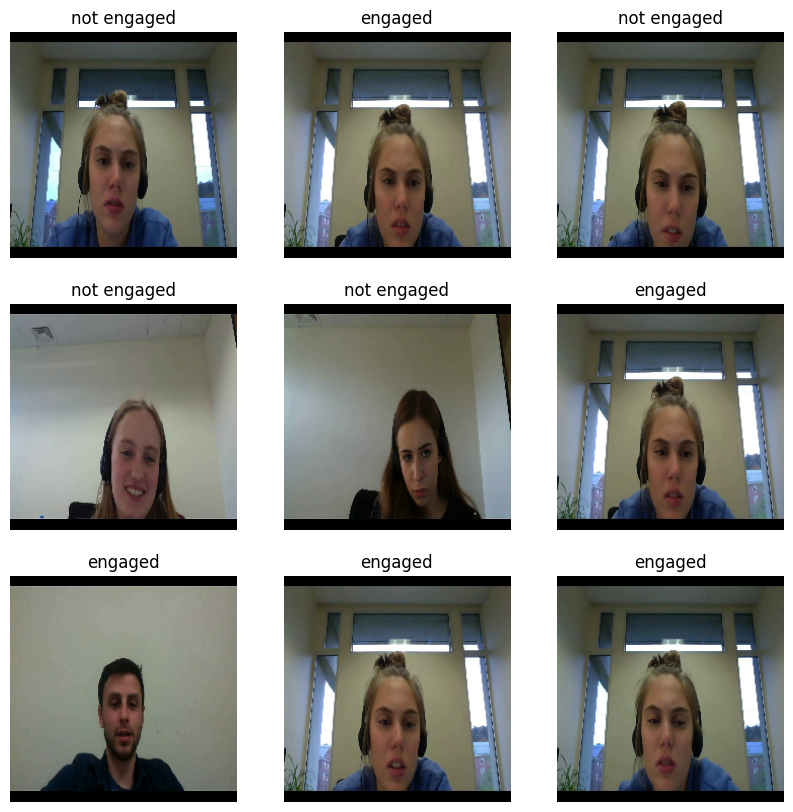

In [9]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Paramètres pour le chargement des images
IMG_SIZE = (224, 224)  # Taille des images à laquelle elles seront redimensionnées
BATCH_SIZE = 32

# Fonction pour charger et prétraiter les images
def load_and_preprocess_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)  # Décodage de l'image JPEG
    img = tf.image.resize(img, IMG_SIZE)  # Redimensionnement de l'image
    img = img / 255.0  # Normalisation de l'image
    return img

# Fonction pour charger les données
def load_dataset(image_paths, labels):
    path_ds = tf.data.Dataset.from_tensor_slices(image_paths)
    label_ds = tf.data.Dataset.from_tensor_slices(labels)
    image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = tf.data.Dataset.zip((image_ds, label_ds))
    dataset = dataset.shuffle(buffer_size=len(image_paths))
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Chargement des ensembles d'entraînement, de validation et de test
train_dataset = load_dataset(train_paths, train_labels)
val_dataset = load_dataset(val_paths, val_labels)
test_dataset = load_dataset(test_paths, test_labels)

# Visualisation de quelques exemples d'images
for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(labels[i].numpy().decode('utf-8'))
        plt.axis('off')
    plt.show()


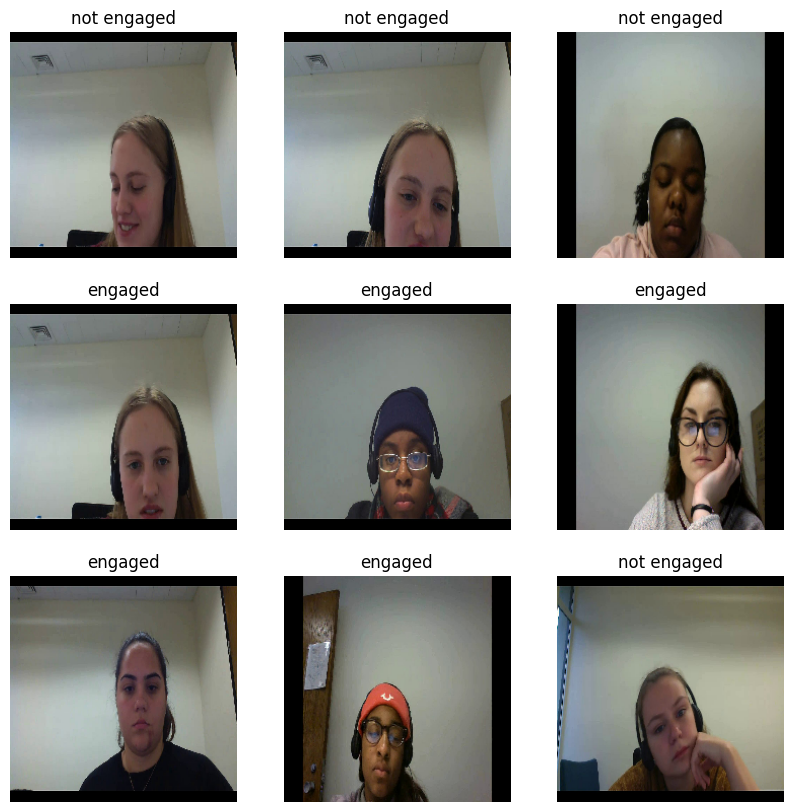

In [10]:
# Visualisation de quelques exemples d'images
for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(labels[i].numpy().decode('utf-8'))
        plt.axis('off')
    plt.show()


Vérification du jeu d'entraînement :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du jeu de validation :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du jeu de test :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du dataset combiné :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)


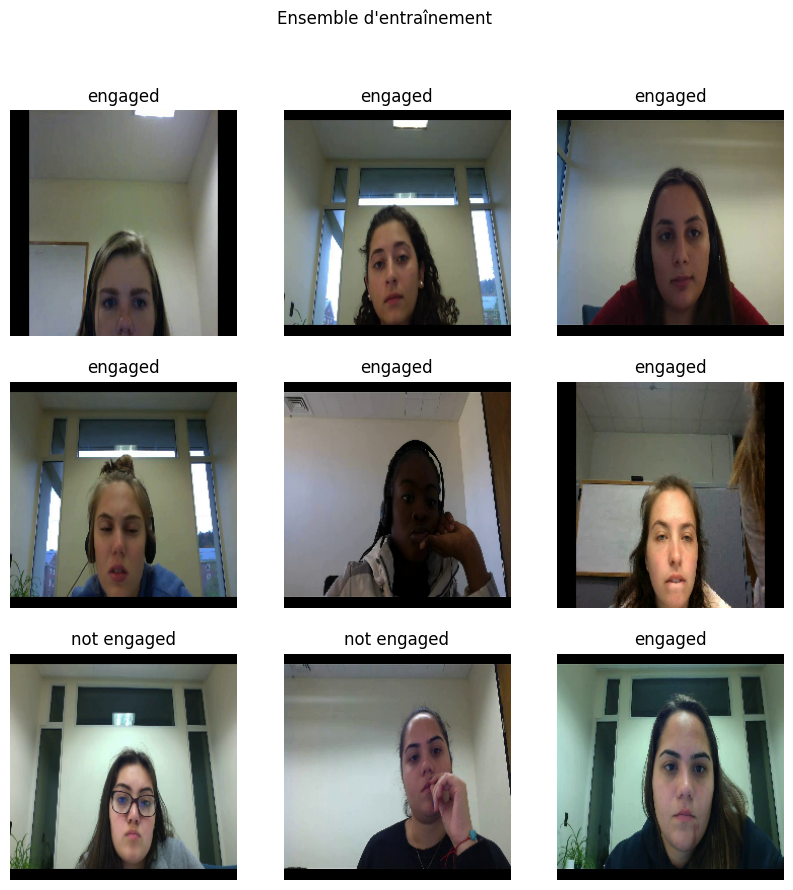

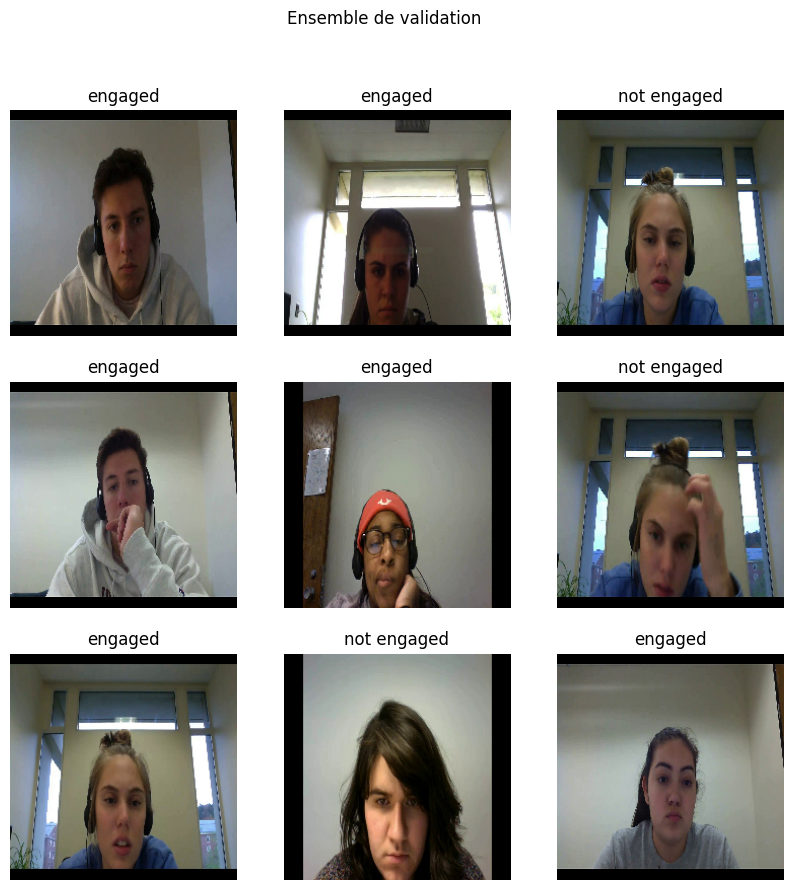

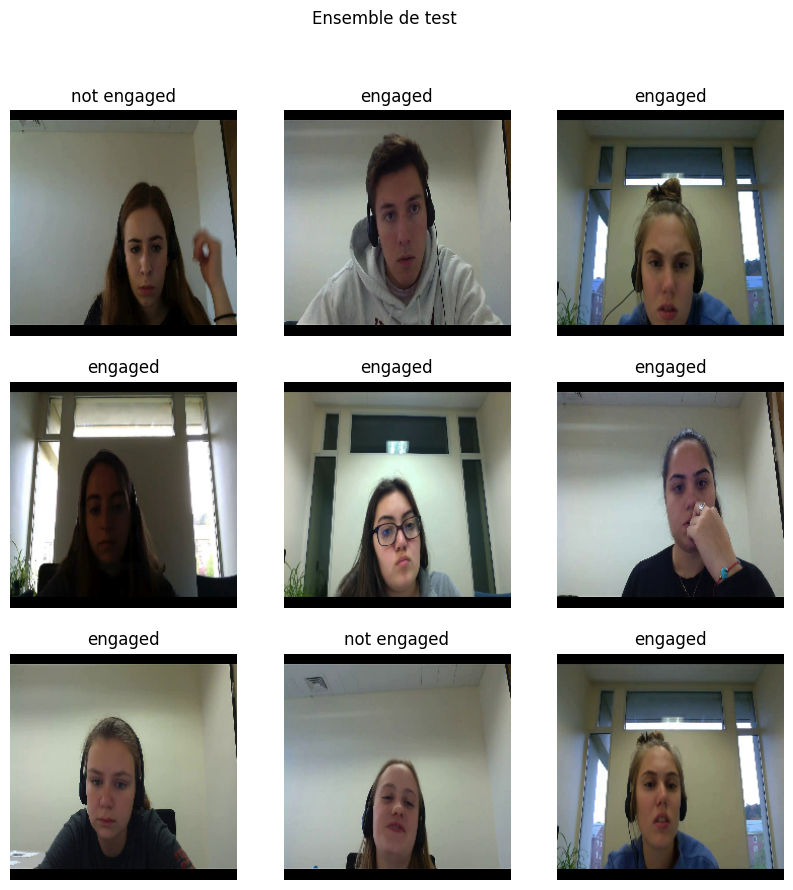

In [11]:
# Fonction pour vérifier la consistance des images et labels
def verify_dataset(dataset):
    for images, labels in dataset.take(1):
        print(f"Taille des images: {images.shape}")
        print(f"Taille des labels: {labels.shape}")

# Combinez les datasets pour une vérification générale
combined_dataset = train_dataset.concatenate(val_dataset).concatenate(test_dataset)

# Vérification des datasets individuels
print("Vérification du jeu d'entraînement :")
verify_dataset(train_dataset)

print("Vérification du jeu de validation :")
verify_dataset(val_dataset)

print("Vérification du jeu de test :")
verify_dataset(test_dataset)

# Vérification du dataset combiné
print("Vérification du dataset combiné :")
verify_dataset(combined_dataset)

# Visualisation des images pour chaque ensemble
def visualize_dataset(dataset, title=""):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i])
            plt.title(labels[i].numpy().decode('utf-8'))
            plt.axis("off")
    plt.suptitle(title)
    plt.show()

# Visualisation des ensembles
visualize_dataset(train_dataset, "Ensemble d'entraînement")
visualize_dataset(val_dataset, "Ensemble de validation")
visualize_dataset(test_dataset, "Ensemble de test")


La forme minimale des images est : [800, 1280, 3]


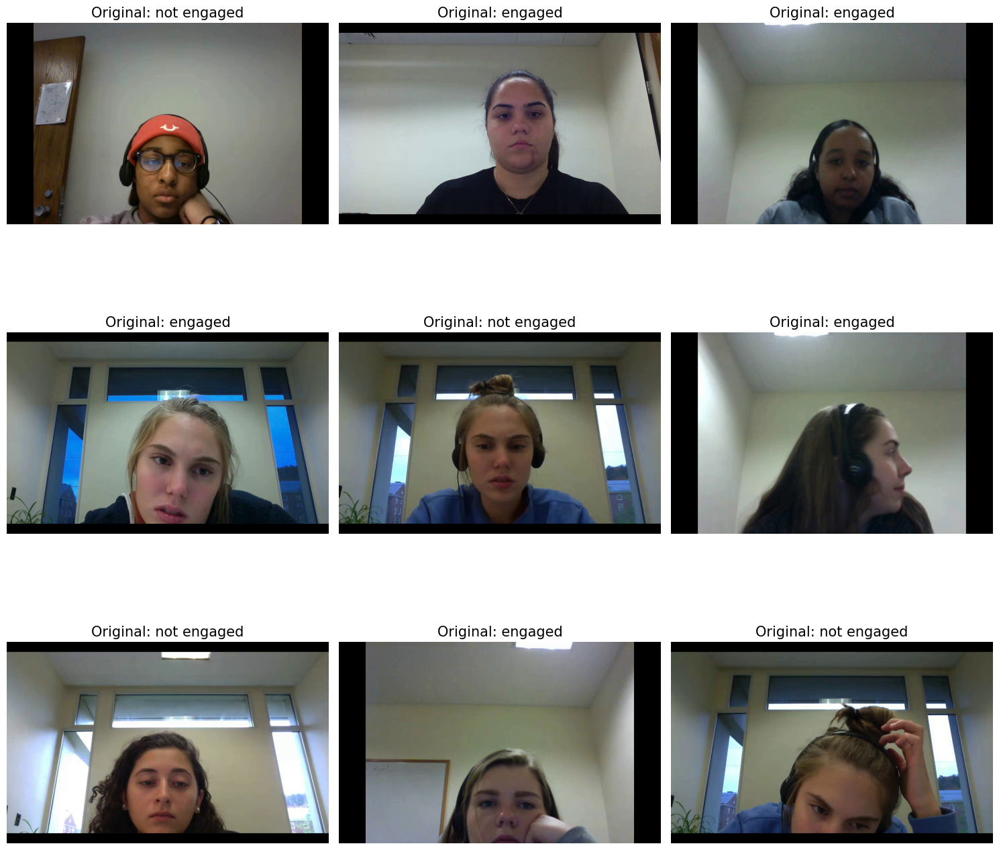

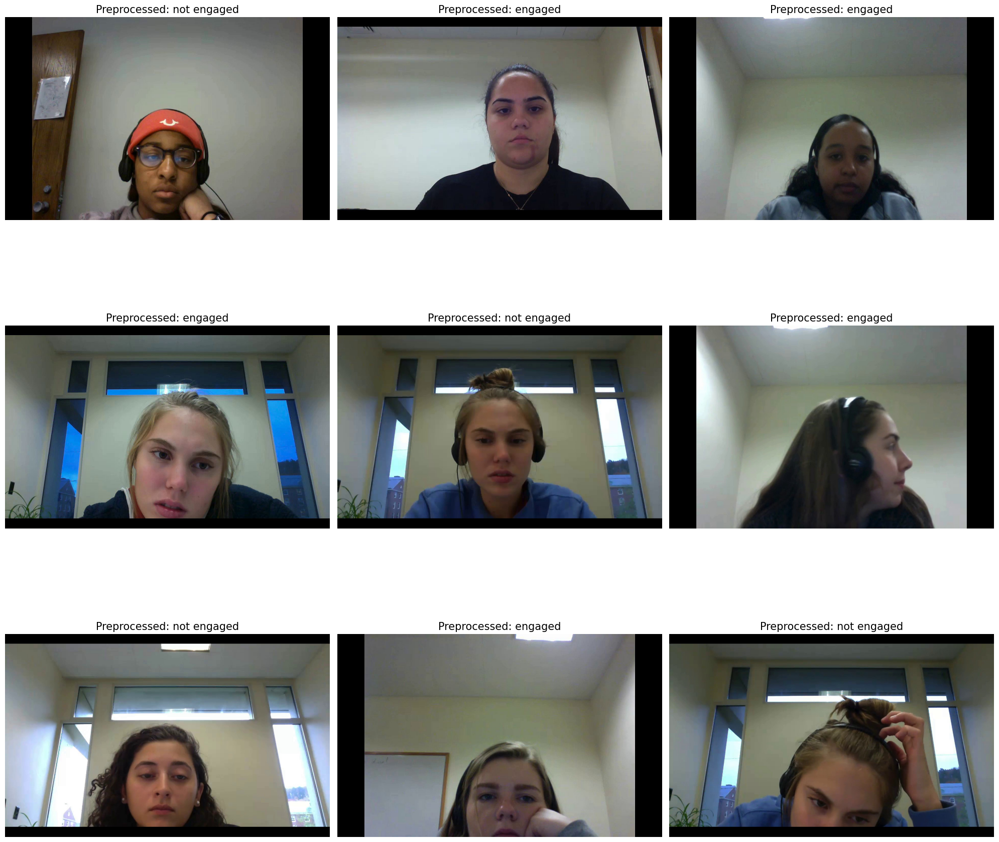

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Supposons que vous avez déjà le DataFrame 'dataset'
# Exemple : dataset = pd.DataFrame({'label': labels, 'image': image_paths, 'preproccesd_image': preprocessed_image_paths})

# Fonction pour charger les images avec PIL
def load_img(file_path):
    try:
        img = Image.open(file_path)
        return img
    except Exception as e:
        print(f"Erreur lors du chargement de l'image {file_path}: {e}")
        return Image.new('RGB', (22, 256))  # Retourner une image vide en cas d'erreur

# 1. Calculer la forme minimale (facultatif, en fonction de vos besoins)
def min_shape(image_paths):
    min_shape = [np.inf, np.inf, 3]
    for path in image_paths:
        img = Image.open(path)
        img = np.array(img)
        for index, shape in enumerate(img.shape):
            if img.shape[index] <= min_shape[index]:
                min_shape[index] = img.shape[index]
    return min_shape

# Afficher la forme minimale (facultatif)
min_shape_value = min_shape(dataset['image'])  # ou dataset['preproccesd_image'] pour les images prétraitées
print(f"La forme minimale des images est : {min_shape_value}")

# 2. Affichage d'un échantillon d'images originales
plt.figure(figsize=(15, 15))
dataset_ = pd.DataFrame(zip(dataset['label'], dataset['image']), columns=['label', 'image'])
files = dataset_.iloc[0:9]

for index, (label, file_path) in enumerate(files.itertuples(index=False)):
    plt.subplot(3, 3, index + 1)
    img = load_img(file_path)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Original: {label}", fontsize=15)
    plt.axis('off')

plt.tight_layout()
plt.show()

# 3. Affichage d'un échantillon d'images après prétraitement
plt.figure(figsize=(20, 20))
dataset_ = pd.DataFrame(zip(dataset['label'], dataset['preproccesd_image']), columns=['label', 'image'])
files = dataset_.iloc[0:9]

for index, (label, file_path) in enumerate(files.itertuples(index=False)):
    plt.subplot(3, 3, index + 1)
    img = load_img(file_path)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Preprocessed: {label}", fontsize=15)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [13]:
from sklearn.preprocessing import LabelEncoder

# Créer un encodeur de labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)
val_labels_encoded = label_encoder.transform(val_labels)
test_labels_encoded = label_encoder.transform(test_labels)

# Vérifiez que les labels encodés sont des entiers
print("Exemples de labels encodés:", train_labels_encoded[:5])


Exemples de labels encodés: [1 1 0 0 0]


In [14]:
def load_dataset(image_paths, labels_encoded):
    # Convertir les chemins d'images et les labels encodés en TensorFlow Datasets
    path_ds = tf.data.Dataset.from_tensor_slices(image_paths)
    label_ds = tf.data.Dataset.from_tensor_slices(labels_encoded)

    # Charger et prétraiter les images
    image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Associer les images avec les labels
    dataset = tf.data.Dataset.zip((image_ds, label_ds))

    # Mélanger et batcher les données
    dataset = dataset.shuffle(buffer_size=len(image_paths))
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

# Recréer les datasets avec les labels encodés
train_dataset = load_dataset(train_paths, train_labels_encoded)
val_dataset = load_dataset(val_paths, val_labels_encoded)
test_dataset = load_dataset(test_paths, test_labels_encoded)


# **CNN**

In [16]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import time


# Définir les dimensions des images
img_size = (224, 224, 3) # Change the image size to match the actual input

# Construire le modèle avec les dimensions correctes
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=img_size),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(label_encoder.classes_), activation='softmax')  # Output layer
])

# Afficher le résumé du modèle pour vérifier les tailles
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,218 (42.61 MB)

 Trainable params: 11,169,218 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
# Compiler le modèle
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Mesurer le temps d'entraînement
start_time = time.time()  # Temps de début

# Entraîner le modèle
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=50
)

end_time = time.time()  # Temps de fin
training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement : {training_time:.2f} secondes")

Epoch 1/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - accuracy: 0.6585 - loss: 0.8192 - val_accuracy: 0.7534 - val_loss: 0.4645
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - accuracy: 0.7835 - loss: 0.4398 - val_accuracy: 0.8272 - val_loss: 0.3837
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - accuracy: 0.8326 - loss: 0.3513 - val_accuracy: 0.7806 - val_loss: 0.4446
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - accuracy: 0.8477 - loss: 0.3363 - val_accuracy: 0.8466 - val_loss: 0.3245
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.8727 - loss: 0.2861 - val_accuracy: 0.8544 - val_loss: 0.3237
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - accuracy: 0.8976 - loss: 0.2343 - val_accuracy: 0.8641 - val_loss: 0.2845
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - accuracy: 0.9301 - loss: 0.1753 - val_accuracy: 0.8874 - val_loss: 0.2812
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - accuracy: 0.9436 - loss: 0.1514 - val_accuracy: 

In [23]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy pour classification_report
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engaged', 'not engaged']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
              precision    recall  f1-score   support

     engaged       0.90      0.89      0.90       295
 not engaged       0.86      0.86      0.86       221

    accuracy                           0.88       516
   macro avg       0.88      0.88      0.88       516
weighted avg       0.88      0.88      0.88       516



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


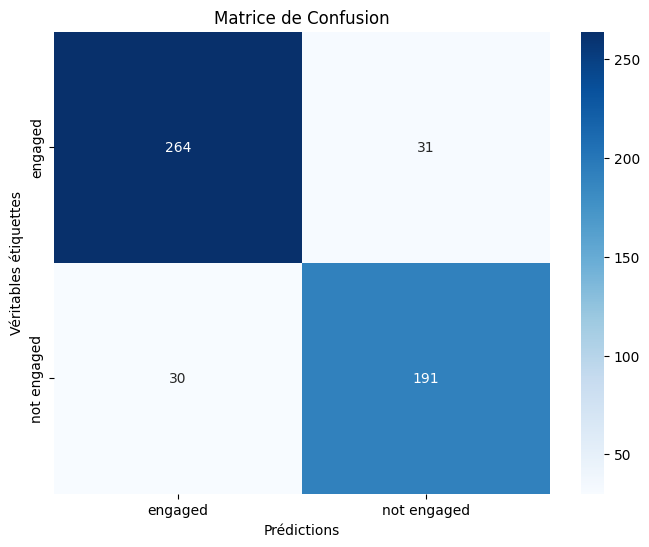

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['engaged', 'not engaged'],
            yticklabels=['engaged', 'not engaged'])
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion')
plt.show()


17/17 - 5s - 312ms/step - accuracy: 0.8818 - loss: 0.6781
Précision sur les données de test : 88.18%


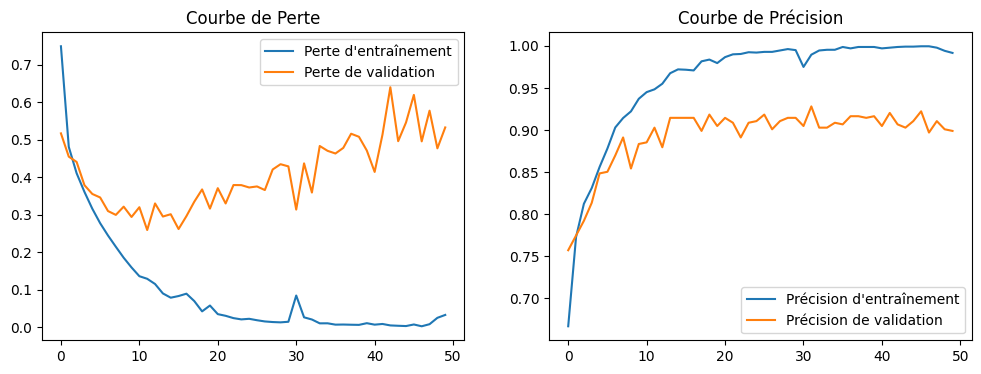

In [25]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_dataset, verbose=2)  # Use 'model' instead of 'model_cnn'

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Perte d\'entraînement')  # Use 'history' instead of 'history_cnn'
plt.plot(history.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Précision d\'entraînement')  # Use 'history'
plt.plot(history.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()

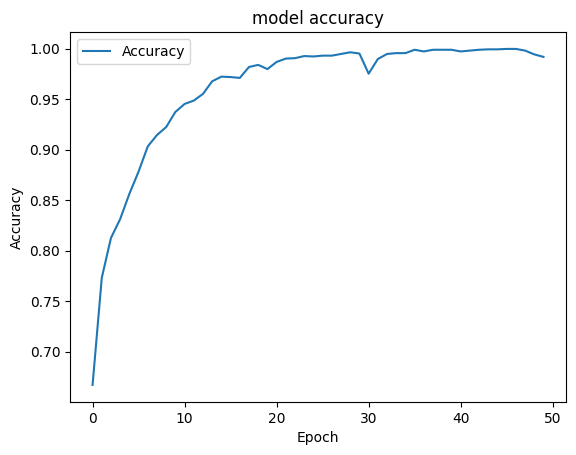

In [26]:
plt.plot(history.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

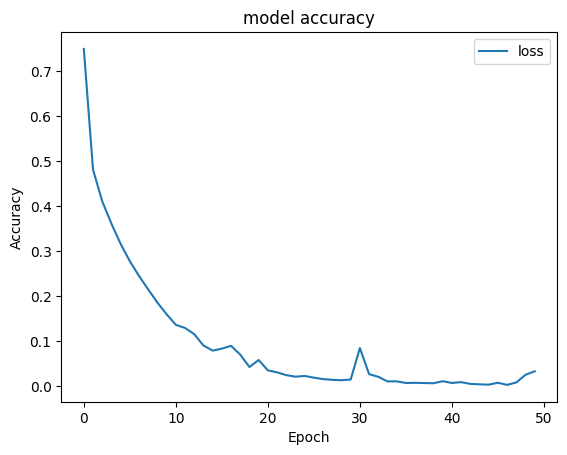

In [27]:
plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [28]:
history.history["accuracy"][-1]

0.9916840195655823

Original output: engaged
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step
Predicted output: engaged


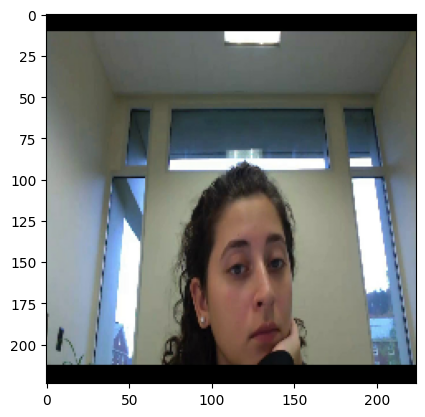

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


# **LSTM-CNN**

In [15]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
import time

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Configuration
img_height, img_width = 224, 224
batch_size = 32
num_classes = 2  # Change this according to your number of classes

# Préparation des générateurs de données avec data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,               # Normalisation
    rotation_range=6,             # Rotation aléatoire (moins importante)
    width_shift_range=0.09,       # Décalage horizontal
    height_shift_range=0.09,      # Décalage vertical
    shear_range=0.1,              # Cisaillement
    zoom_range=0.09,              # Zoom
    horizontal_flip=True,         # Flip horizontal
    brightness_range=[0.8, 1.2]   # Modulation de la luminosité
)

# Sans augmentation pour validation et test
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Générateurs
train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/val',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 2405 images belonging to 2 classes.
Found 515 images belonging to 2 classes.
Found 516 images belonging to 2 classes.


In [17]:

# Définir le modèle CNN pour l'extraction des caractéristiques
def create_cnn_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten()
    ])
    return model

cnn_model = create_cnn_model((img_height, img_width, 3))


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [18]:
# Fonction pour extraire les caractéristiques à partir du CNN
def extract_features(generator, cnn_model):
    features = []
    labels = []
    for batch in generator:
        imgs, lbls = batch
        feats = cnn_model.predict(imgs)
        feats = np.reshape(feats, (feats.shape[0], -1, feats.shape[-1]))  # Reshape pour LSTM
        features.append(feats)
        labels.append(lbls)
        if len(features) * batch_size >= generator.samples:
            break
    return np.vstack(features), np.vstack(labels)

train_features, train_labels = extract_features(train_generator, cnn_model)
val_features, val_labels = extract_features(val_generator, cnn_model)
test_features, test_labels = extract_features(test_generator, cnn_model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━

In [19]:
# Définir le modèle LSTM
model_lstm = Sequential([
    LSTM(128, input_shape=train_features.shape[1:], return_sequences=False),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])
start_time = time.time()  # Temps de début

# Compiler le modèle
model_lstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraîner le modèle sans EarlyStopping
history_lstm = model_lstm.fit(
    train_features, train_labels,
    epochs=50,
    validation_data=(val_features, val_labels)
)
end_time = time.time()

training_time = end_time - start_time

# Évaluer le modèle
test_loss, test_accuracy = model_lstm.evaluate(test_features, test_labels, verbose=2)
print(f'Précision sur les données de test (LSTM avec CNN) : {test_accuracy * 100:.2f}%')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5274 - loss: 0.7975 - val_accuracy: 0.5709 - val_loss: 0.6822
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5056 - loss: 0.7318 - val_accuracy: 0.5709 - val_loss: 0.6770
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.5569 - loss: 0.7041 - val_accuracy: 0.5709 - val_loss: 0.6783
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.5599 - loss: 0.7004 - val_accuracy: 0.5709 - val_loss: 0.6762
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - accuracy: 0.5740 - loss: 0.6833 - val_accuracy: 0.5709 - val_loss: 0.6732
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.5946 - loss: 0.6699 - val_accuracy: 0.5709 - val_loss: 0.6670
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.5825 - loss: 0.6731 - val_accuracy: 0.6583 - val_loss: 0.6700
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.5955 - loss: 0.6721 - val_accuracy: 0.5709 - v

In [20]:
print(f"Temps d'entraînement LSTM : {training_time:.2f} secondes")


Temps d'entraînement LSTM : 224.50 secondes


In [24]:
from sklearn.metrics import classification_report
import numpy as np

# Faire des prédictions sur les données de test
y_pred = model_lstm.predict(test_features)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(test_labels, axis=1)

# Obtenir les noms des classes
class_labels = list(test_generator.class_indices.keys())

# Afficher le rapport de classification
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test (LSTM avec CNN) : {test_accuracy * 100:.2f}%')


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
              precision    recall  f1-score   support

     engaged       0.76      0.74      0.75       295
 not engaged       0.67      0.68      0.67       221

    accuracy                           0.72       516
   macro avg       0.71      0.71      0.71       516
weighted avg       0.72      0.72      0.72       516

Précision sur les données de test (LSTM avec CNN) : 71.71%


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


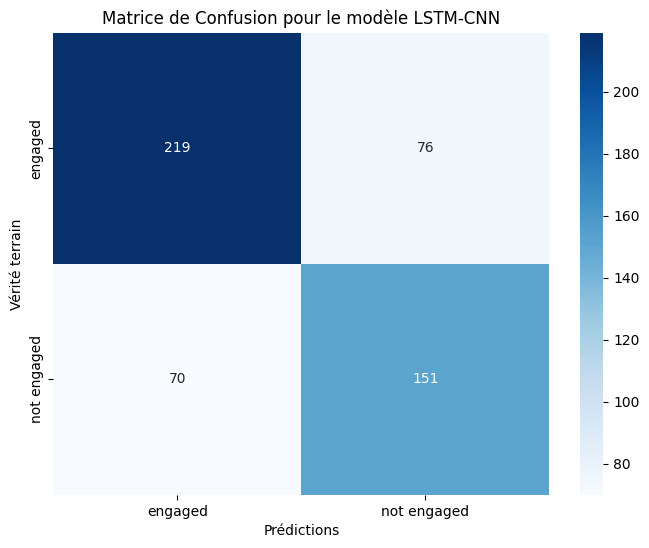

In [25]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Faire des prédictions sur les données de test
y_pred = model_lstm.predict(test_features)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(test_labels, axis=1)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Afficher la matrice de confusion
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Prédictions')
plt.ylabel('Vérité terrain')
plt.title('Matrice de Confusion pour le modèle LSTM-CNN')
plt.show()


17/17 - 0s - 12ms/step - accuracy: 0.7171 - loss: 0.6056
Précision sur les données de test (LSTM-CNN) : 71.71%


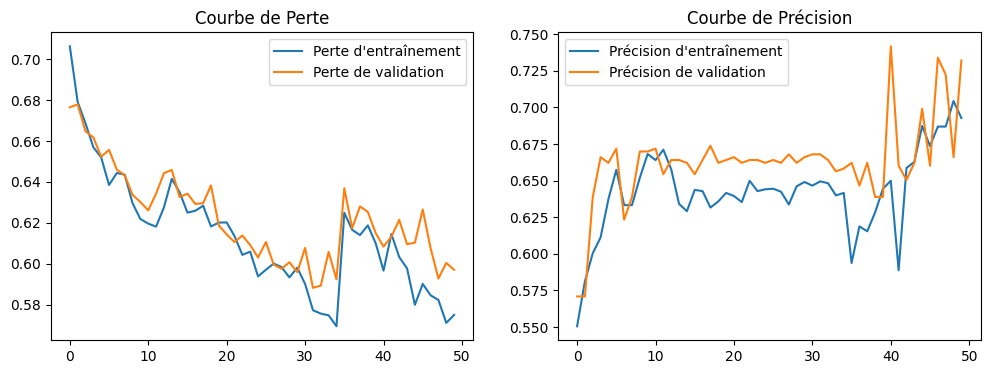

In [26]:
import matplotlib.pyplot as plt

# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_lstm.evaluate(test_features, test_labels, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test (LSTM-CNN) : {test_accuracy * 100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))

# Courbe de perte
plt.subplot(1, 2, 1)
plt.plot(history_lstm.history['loss'], label='Perte d\'entraînement')
plt.plot(history_lstm.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

# Courbe de précision
plt.subplot(1, 2, 2)
plt.plot(history_lstm.history['accuracy'], label='Précision d\'entraînement')
plt.plot(history_lstm.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()


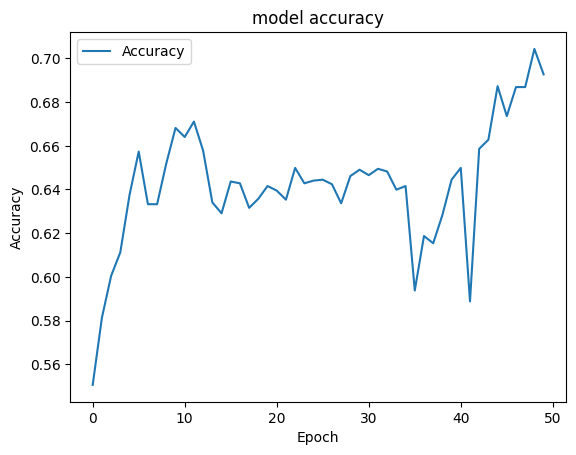

In [27]:
plt.plot(history_lstm.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

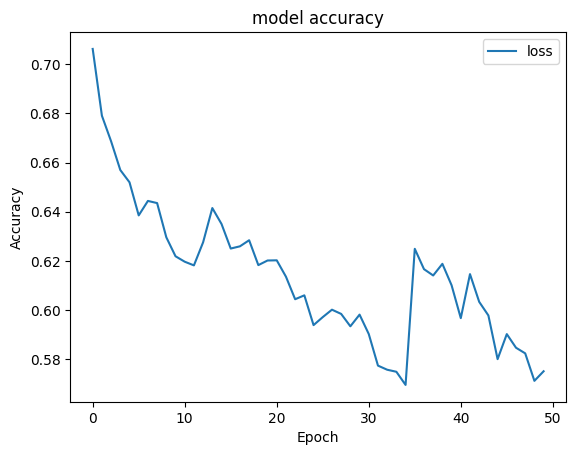

In [28]:
plt.plot(history_lstm.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [29]:
history_lstm.history["accuracy"][-1]

0.6927235126495361

Original output: engaged
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Predicted output: not engaged


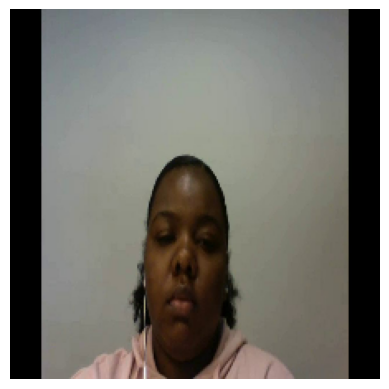

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# Taille des images (doit correspondre à celle utilisée lors de la création des caractéristiques)
IMG_SIZE = (224, 224, 3)

# Assurez-vous que le label_encoder a été défini et ajusté sur les classes
# Exemple : label_encoder.fit_transform(your_classes)

# Convertir les images de test en numpy array si ce n'est pas déjà fait
test_images = np.array(test_images)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_features))

# Afficher le label original
original_label = test_labels[image_index].argmax()  # Si les labels sont one-hot encodés
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
# Reshape des features pour correspondre au format attendu par le LSTM
pred = model_lstm.predict(test_features[image_index].reshape(1, test_features.shape[1], test_features.shape[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image correspondante
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.axis('off')  # Cacher les axes pour un affichage plus propre
plt.show()


In [37]:
# Exemple pour sauvegarder un modèle
model_lstm.save('/content/drive/MyDrive/Colab Notebooks/data1 (2)/model_lstm.keras', save_format='keras')

In [38]:
# Sauvegarder le modèle LSTM-CNN
model_lstm.save('/content/drive/MyDrive/Colab Notebooks/data1 (2)/model_lstm.h5')

# Afficher un message de confirmation
print("Le modèle LSTM-CNN a été sauvegardé avec succès.")


Le modèle LSTM-CNN a été sauvegardé avec succès.


# **Transfert Learning Vgg16**

In [21]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import time


In [40]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/images'

In [22]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Chemins pour les données
train_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/val'
test_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/test'

# Préparation des données sans prétraitement ni augmentation
train_datagen = ImageDataGenerator()  # Pas de rescale, pas d'augmentation
val_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Taille attendue par VGG16
    batch_size=32,
    class_mode='categorical'  # Assurez-vous que vos labels sont one-hot encodés
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Nombre de classes
num_classes = len(train_generator.class_indices)

# Charger le modèle pré-entraîné VGG16 (sans les couches de classification)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Ajouter des couches personnalisées pour la classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

Found 2405 images belonging to 2 classes.
Found 515 images belonging to 2 classes.
Found 516 images belonging to 2 classes.


In [23]:
# Charger le modèle pré-entraîné VGG16 (sans les couches de classification)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Ajouter des couches personnalisées pour la classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Créer le modèle complet
model_transfer = Model(inputs=base_model.input, outputs=predictions)

# Geler les couches du modèle VGG16 pour empêcher leur entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compiler le modèle avec une fonction de perte, un optimiseur et des métriques
model_transfer.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

start_time = time.time()  # Temps de début

# Entraîner le modèle de transfert learning sur les données d'entraînement
epochs = 50

history_transfer = model_transfer.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator
)
end_time = time.time()

training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement VGG16 (Transfert Learning) : {training_time:.2f} secondes")

# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_transfer.evaluate(test_generator, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


76/76 ━━━━━━━━━━━━━━━━━━━━ 63s 541ms/step - accuracy: 0.6550 - loss: 1.6218 - val_accuracy: 0.7709 - val_loss: 0.5110
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 29s 357ms/step - accuracy: 0.7691 - loss: 0.5501 - val_accuracy: 0.7903 - val_loss: 0.4279
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 29s 356ms/step - accuracy: 0.8040 - loss: 0.4272 - val_accuracy: 0.8058 - val_loss: 0.4147
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 40s 350ms/step - accuracy: 0.8171 - loss: 0.3972 - val_accuracy: 0.8311 - val_loss: 0.3776
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 28s 348ms/step - accuracy: 0.8203 - loss: 0.3925 - val_accuracy: 0.7825 - val_loss: 0.4193
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 28s 349ms/step - accuracy: 0.8283 - loss: 0.3613 - val_accuracy: 0.8447 - val_loss: 0.3549
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 28s 345ms/step - accuracy: 0.8374 - loss: 0.3590 - val_accuracy: 0.8291 - val_loss: 0.3615
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 42s 362ms/step - accuracy: 0.8407 - loss: 0.3395 - val_accuracy: 0.801

17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 304ms/step


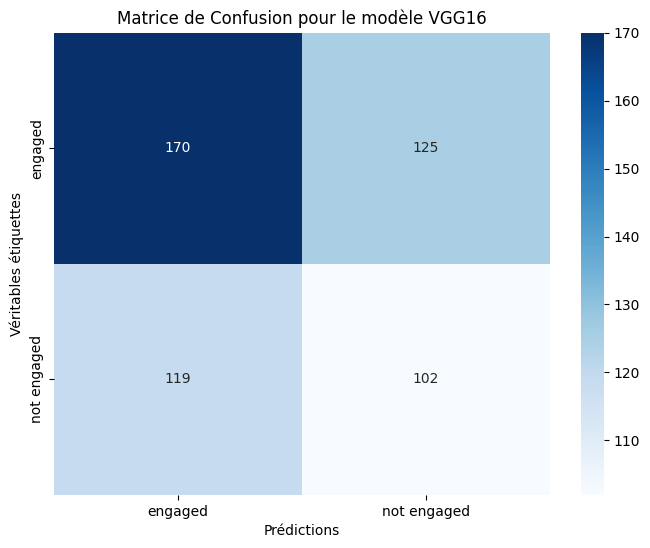

In [51]:
# Importations nécessaires
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Obtenez les vraies étiquettes
y_true = test_generator.classes

# Obtenez les prédictions pour le dataset de test
y_pred = model_transfer.predict(test_generator, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir les prédictions en classes

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion pour le modèle VGG16')
plt.show()


In [53]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_generator est correctement défini
# Pour chaque batch d'images dans test_generator, obtenez les prédictions
y_true = []
y_pred = []

# Parcourez le générateur de test manuellement
for i in range(len(test_generator)):
    images, labels = test_generator[i]  # Extraire les images et labels du générateur
    predictions = model_transfer.predict(images)  # Faire les prédictions
    y_true.extend(np.argmax(labels, axis=1))  # Convertir les labels one-hot en indices
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engaged', 'not engaged']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
              precision    recall  f1-score   support

     engaged       0.90      0.88      0.89       295
 not engaged       0.84      0.86      0.85       221

    accuracy                           0.87       516
   macro avg       0.87      0.87      0.87       516
weighted avg       0.87      0.87      0.87       516



17/17 - 5s - 271ms/step - accuracy: 0.8721 - loss: 0.3206
Précision sur les données de test : 87.21%


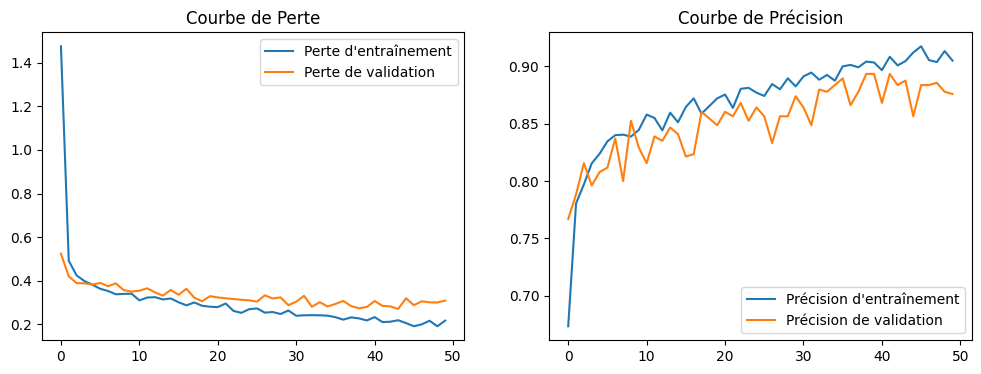

In [54]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_transfer.evaluate(test_generator, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history_transfer.history['loss'], label='Perte d\'entraînement')  # Utiliser 'history_transfer'
plt.plot(history_transfer.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history_transfer.history['accuracy'], label='Précision d\'entraînement')  # Utiliser 'history_transfer'
plt.plot(history_transfer.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()


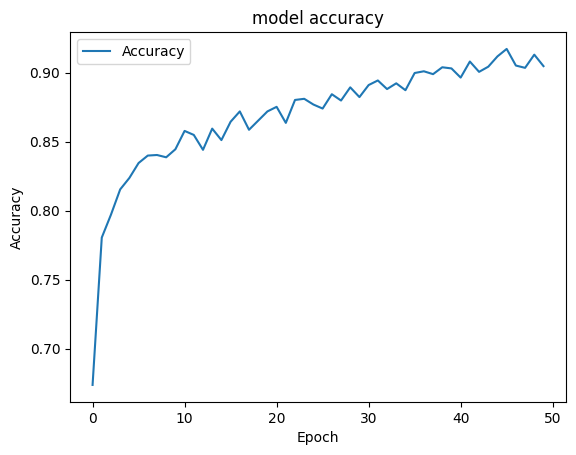

In [55]:
plt.plot(history_transfer.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

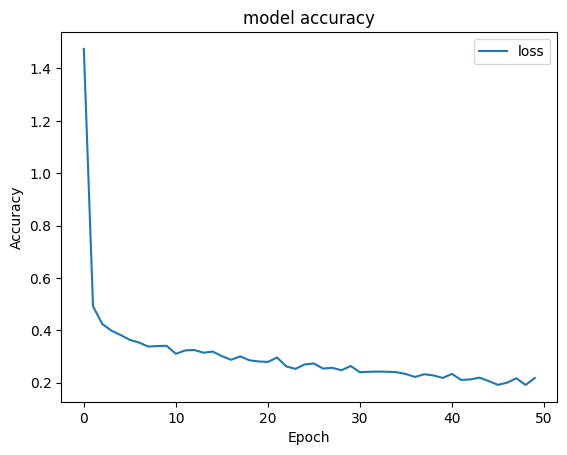

In [56]:
plt.plot(history_transfer.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [57]:
history_transfer.history["accuracy"][-1]

0.904781699180603

Original output: not engaged
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted output: not engaged


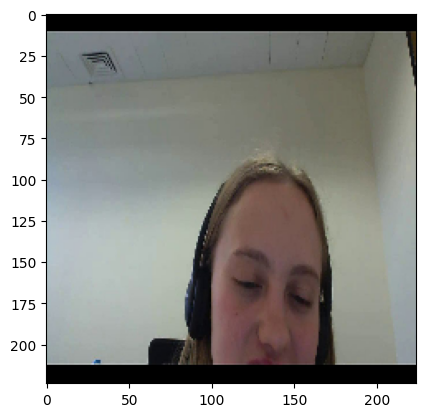

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


In [59]:
# Exemple pour sauvegarder un modèle
model_transfer.save('/content/drive/MyDrive/Colab Notebooks/data1 (2)/model_trabsfert.keras', save_format='keras')

In [60]:
# Sauvegarder le modèle Transfert Learning
model_lstm.save('/content/drive/MyDrive/Colab Notebooks/data1 (2)/model_trabsfert.h5')

# Afficher un message de confirmation
print("Le modèle Transfert learning a été sauvegardé avec succès.")


Le modèle Transfert learning a été sauvegardé avec succès.


In [24]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow import keras
import time

# Step 1: Préparation des données (assumant des images de 224x224)
train_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/val'
test_dir = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/output1/test'

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # input size
    batch_size=32,
    class_mode='sparse'  # integer labels
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

# Step 2: Définir l'Embedding Positionnel et l'Encodeur Transformer
class PositionalEmbedding(layers.Layer):
    def __init__(self, num_patches, embed_dim):
        super().__init__()
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=embed_dim)

    def call(self, x):
        positions = tf.range(start=0, limit=num_patches, delta=1)
        embedded_positions = self.position_embedding(positions)
        return x + embedded_positions

class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.3)
        self.dense_proj = keras.Sequential(
            [layers.Dense(dense_dim, activation=tf.nn.gelu),
             layers.Dense(embed_dim)]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()

    def call(self, inputs, mask=None):
        if mask is not None:
            mask = mask[:, tf.newaxis, :]

        attention_output = self.attention(inputs, inputs, attention_mask=mask)
        proj_input = self.layernorm_1(inputs + attention_output)
        proj_output = self.dense_proj(proj_input)
        return self.layernorm_2(proj_input + proj_output)

# Step 3: Construire le modèle Transformer
def build_transformer_model(input_shape, num_patches, embed_dim, num_heads, dense_dim, num_classes):
    inputs = layers.Input(shape=input_shape)

    # Créer des patches et les embedder
    x = layers.Conv2D(filters=embed_dim, kernel_size=(16, 16), strides=(16, 16))(inputs)
    x = layers.Reshape((num_patches, embed_dim))(x)

    # Ajouter les embeddings positionnels
    x = PositionalEmbedding(num_patches, embed_dim)(x)

    # Appliquer l'encodeur Transformer
    x = TransformerEncoder(embed_dim, dense_dim, num_heads)(x)
    x = layers.GlobalAveragePooling1D()(x)

    # Couche de classification finale
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs)
    return model

# Step 4: Compiler et entraîner le modèle
image_size = 224  # Taille de l'image (224x224)
patch_size = 16    # Taille des patches (16x16)
num_patches = (image_size // patch_size) ** 2
embed_dim = 64
num_heads = 4
dense_dim = 128
num_classes = len(train_generator.class_indices)

model = build_transformer_model((image_size, image_size, 3), num_patches, embed_dim, num_heads, dense_dim, num_classes)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Mesurer le temps d'entraînement
start_time = time.time()

# Entraîner le modèle
epochs = 50
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator
)
end_time = time.time()  # Temps de fin
training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement Transformer : {training_time:.2f} secondes")


# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_generator, verbose=2)
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')


Found 2405 images belonging to 2 classes.
Found 515 images belonging to 2 classes.
Found 516 images belonging to 2 classes.
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


76/76 ━━━━━━━━━━━━━━━━━━━━ 41s 408ms/step - accuracy: 0.5207 - loss: 1.0701 - val_accuracy: 0.5709 - val_loss: 0.6849
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 29s 306ms/step - accuracy: 0.5667 - loss: 0.6898 - val_accuracy: 0.5709 - val_loss: 0.6794
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 32s 395ms/step - accuracy: 0.5719 - loss: 0.6791 - val_accuracy: 0.4932 - val_loss: 0.7105
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 27s 322ms/step - accuracy: 0.5506 - loss: 0.6840 - val_accuracy: 0.5223 - val_loss: 0.6872
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 25s 306ms/step - accuracy: 0.5907 - loss: 0.6663 - val_accuracy: 0.6019 - val_loss: 0.6657
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 42s 324ms/step - accuracy: 0.6348 - loss: 0.6635 - val_accuracy: 0.6544 - val_loss: 0.6509
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 25s 311ms/step - accuracy: 0.6718 - loss: 0.6309 - val_accuracy: 0.6641 - val_loss: 0.6335
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 24s 294ms/step - accuracy: 0.6716 - loss: 0.6085 - val_accuracy: 0.706

In [63]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy pour classification_report
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engaged', 'not engaged']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
              precision    recall  f1-score   support

     engaged       0.76      0.96      0.85       295
 not engaged       0.92      0.59      0.72       221

    accuracy                           0.80       516
   macro avg       0.84      0.78      0.79       516
weighted avg       0.83      0.80      0.79       516



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


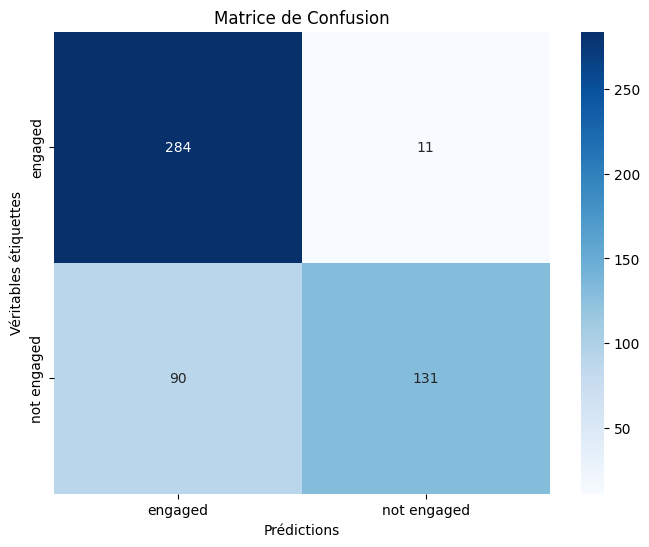

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['engaged', 'not engaged'],
            yticklabels=['engaged', 'not engaged'])
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion')
plt.show()


17/17 - 8s - 489ms/step - accuracy: 0.8043 - loss: 0.4262
Précision sur les données de test : 80.43%


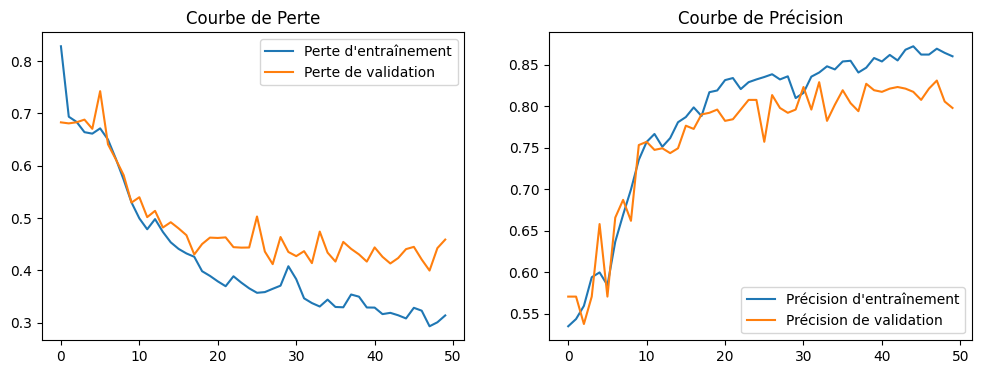

In [65]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_dataset, verbose=2)  # Use 'model' instead of 'model_cnn'

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Perte d\'entraînement')  # Use 'history' instead of 'history_cnn'
plt.plot(history.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Précision d\'entraînement')  # Use 'history'
plt.plot(history.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()

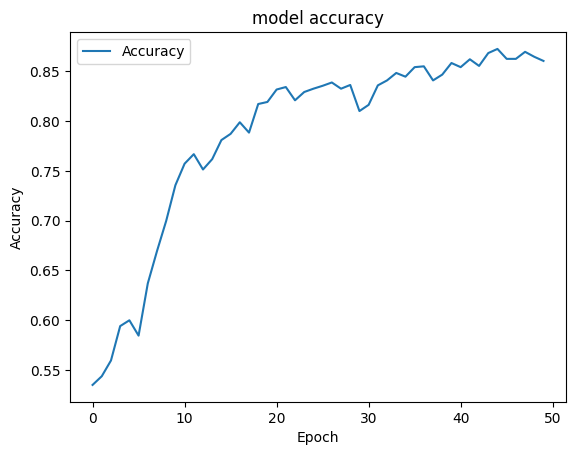

In [66]:
plt.plot(history.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

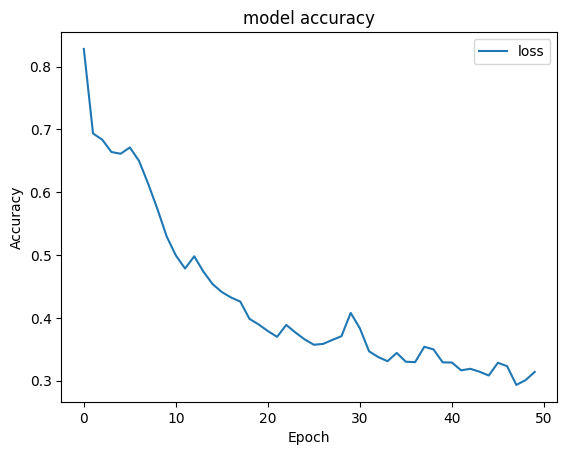

In [67]:
plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [68]:
history.history["accuracy"][-1]

0.860291063785553

Original output: not engaged
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step
Predicted output: engaged


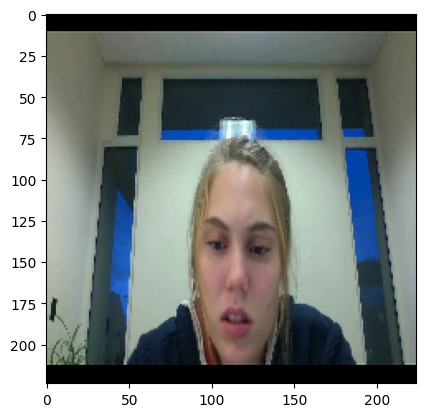

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


In [70]:
# Chemin pour enregistrer le modèle dans Google Drive au format Keras
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/transformer.keras'

# Enregistrer le modèle complet au format Keras
model.save(model_save_path, save_format='keras')


In [71]:
# prompt: how to save the model

# Chemin pour enregistrer le modèle
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data1 (2)/transformer.h5'

# Enregistrer le modèle
model.save(model_save_path)


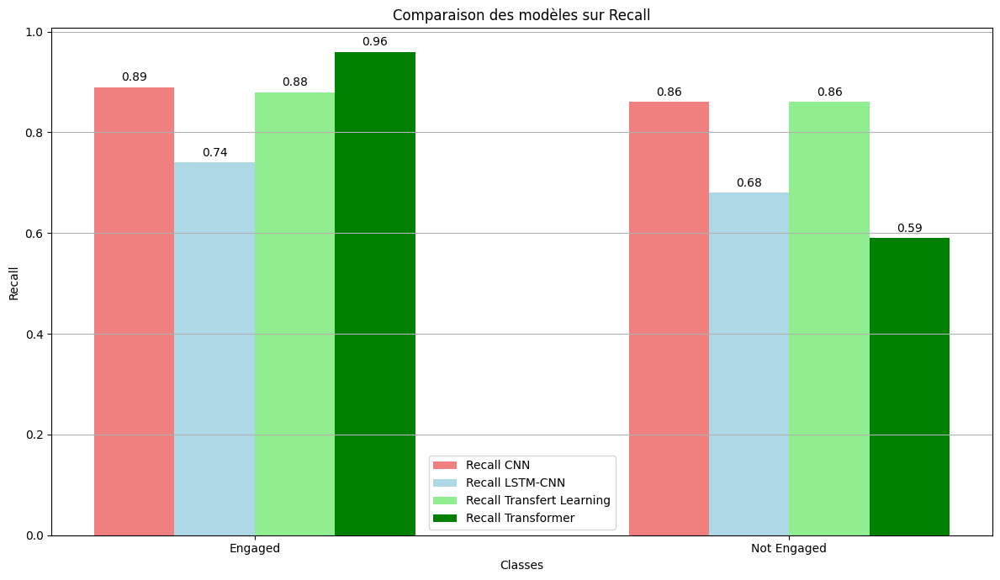

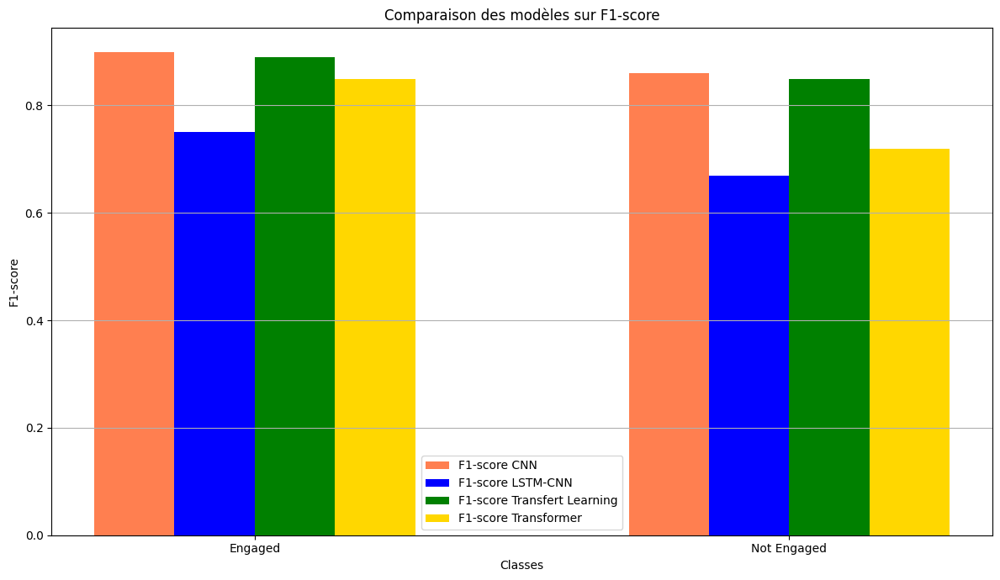

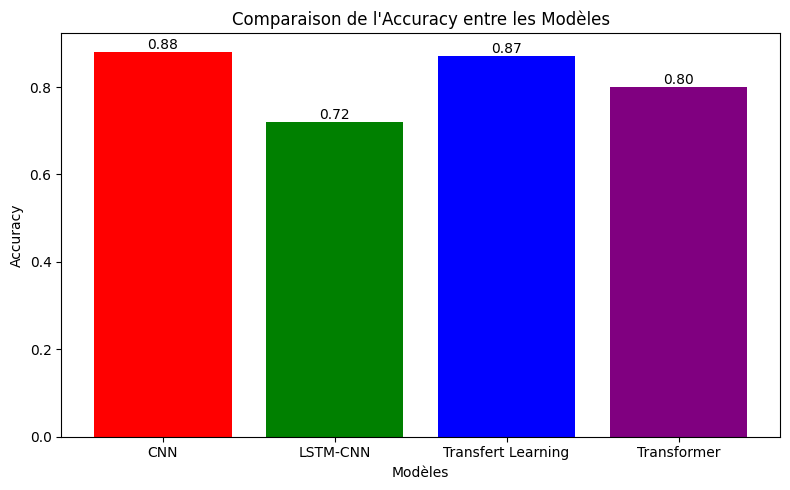

In [80]:
import numpy as np
import matplotlib.pyplot as plt

# Noms des classes
classes = ['Engaged', 'Not Engaged']

# Résultats pour chaque modèle (recall, f1-score, accuracy)
# CNN
recall_model1 = [0.89, 0.86]
f1_model1 = [0.90, 0.86]
accuracy_model1 = 0.88  # Une seule valeur d'Accuracy pour ce modèle

# LSTM-CNN
recall_model2 = [0.74, 0.68]
f1_model2 = [0.75, 0.67]
accuracy_model2 = 0.72

# Transfert Learning VGG16
recall_model3 = [0.88, 0.86]
f1_model3 = [0.89, 0.85]
accuracy_model3 = 0.87

# Transformer
recall_model4 = [0.96, 0.59]
f1_model4 = [0.85, 0.72]
accuracy_model4 = 0.80

# Création de l'indice pour les barres
x = np.arange(len(classes))

# Largeur des barres
width = 0.15  # Ajuster la largeur pour accueillir tous les modèles

# --- Diagramme des Recall ---
fig, ax = plt.subplots(figsize=(12, 7))

# Affichage des barres pour Recall par classe et par modèle
rects1 = ax.bar(x - 1.5*width, recall_model1, width, label='Recall CNN', color='lightcoral')
rects2 = ax.bar(x - 0.5*width, recall_model2, width, label='Recall LSTM-CNN', color='lightblue')
rects3 = ax.bar(x + 0.5*width, recall_model3, width, label='Recall Transfert Learning', color='lightgreen')
rects4 = ax.bar(x + 1.5*width, recall_model4, width, label='Recall Transformer', color='green')

# Ajout des lignes de grille
ax.yaxis.grid(True)

# Ajuster les labels et titres pour le diagramme des Recall
ax.set_xlabel('Classes')
ax.set_ylabel('Recall')
ax.set_title('Comparaison des modèles sur Recall')
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.legend()

# Ajouter les valeurs au-dessus des barres
def add_value_labels(rects):
    """Ajoute des étiquettes de valeur au-dessus de chaque barre."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points au-dessus de la barre
                    textcoords='offset points',
                    ha='center', va='bottom')

add_value_labels(rects1)
add_value_labels(rects2)
add_value_labels(rects3)
add_value_labels(rects4)

plt.tight_layout()
plt.show()

# --- Diagramme des F1-scores ---
fig2, ax2 = plt.subplots(figsize=(12, 7))

# Affichage des barres pour F1-score par classe et par modèle
rects5 = ax2.bar(x - 1.5*width, f1_model1, width, label='F1-score CNN', color='coral')
rects6 = ax2.bar(x - 0.5*width, f1_model2, width, label='F1-score LSTM-CNN', color='blue')
rects7 = ax2.bar(x + 0.5*width, f1_model3, width, label='F1-score Transfert Learning', color='green')
rects8 = ax2.bar(x + 1.5*width, f1_model4, width, label='F1-score Transformer', color='gold')

# Ajout des lignes de grille
ax2.yaxis.grid(True)

# Ajuster les labels et titres pour le diagramme des F1-scores
ax2.set_xlabel('Classes')
ax2.set_ylabel('F1-score')
ax2.set_title('Comparaison des modèles sur F1-score')
ax2.set_xticks(x)
ax2.set_xticklabels(classes)
ax2.legend()

# Ajouter les valeurs au-dessus des barres
add_value_labels(rects5)
add_value_labels(rects6)
add_value_labels(rects7)
add_value_labels(rects8)

plt.tight_layout()
plt.show()

# --- Diagramme de l'Accuracy ---
model_names = ['CNN', 'LSTM-CNN', 'Transfert Learning', 'Transformer']
accuracy_values = [accuracy_model1, accuracy_model2, accuracy_model3, accuracy_model4]

fig3, ax3 = plt.subplots(figsize=(8, 5))
ax3.bar(model_names, accuracy_values, color=['red', 'green', 'blue', 'purple'])
ax3.set_xlabel('Modèles')
ax3.set_ylabel('Accuracy')
ax3.set_title('Comparaison de l\'Accuracy entre les Modèles')

# Ajouter les valeurs au-dessus des barres d'Accuracy
for i, value in enumerate(accuracy_values):
    ax3.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


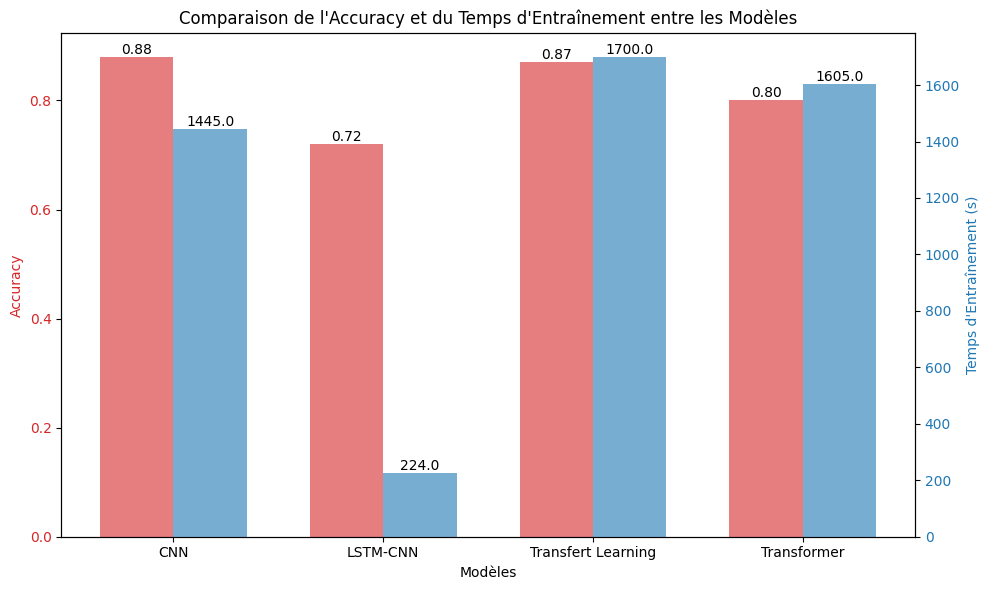

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Noms des modèles
model_names = ['CNN', 'LSTM-CNN', 'Transfert Learning', 'Transformer']

# Valeurs d'accuracy (définies ici)
accuracy_model1 = 0.88  # CNN
accuracy_model2 = 0.72  # LSTM-CNN
accuracy_model3 = 0.87  # Transfert Learning VGG16
accuracy_model4 = 0.80  # Transformer

# Liste des valeurs d'accuracy
accuracy_values = [accuracy_model1, accuracy_model2, accuracy_model3, accuracy_model4]

# Valeurs de temps d'entraînement (en secondes)
training_times = [1445, 224, 1700, 1605]  # Temps d'entraînement en secondes

# Création de la figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Largeur des barres
bar_width = 0.35
index = np.arange(len(model_names))

# --- Barres d'Accuracy ---
bars1 = ax1.bar(index, accuracy_values, bar_width, label='Accuracy', color='tab:red', alpha=0.6)

# Ajouter l'échelle de l'accuracy
ax1.set_ylabel('Accuracy', color='tab:red')
ax1.tick_params(axis='y', labelcolor='tab:red')

# Ajouter les valeurs au-dessus des barres d'Accuracy
for bar in bars1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Instanciation d'un second axe partagé pour le temps d'entraînement
ax2 = ax1.twinx()

# --- Barres de Temps d'Entraînement ---
bars2 = ax2.bar(index + bar_width, training_times, bar_width, label='Temps d\'Entraînement (s)', color='tab:blue', alpha=0.6)

# Ajouter l'échelle de temps d'entraînement
ax2.set_ylabel('Temps d\'Entraînement (s)', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Ajouter les valeurs de temps au-dessus des barres
for bar in bars2:
    yval = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}', ha='center', va='bottom')

# Étiquettes et légende
ax1.set_xlabel('Modèles')
ax1.set_title('Comparaison de l\'Accuracy et du Temps d\'Entraînement entre les Modèles')
ax1.set_xticks(index + bar_width / 2)  # Position des labels des modèles
ax1.set_xticklabels(model_names)

# Affichage de la légende
fig.tight_layout()  # Ajustement de la mise en page
plt.show()


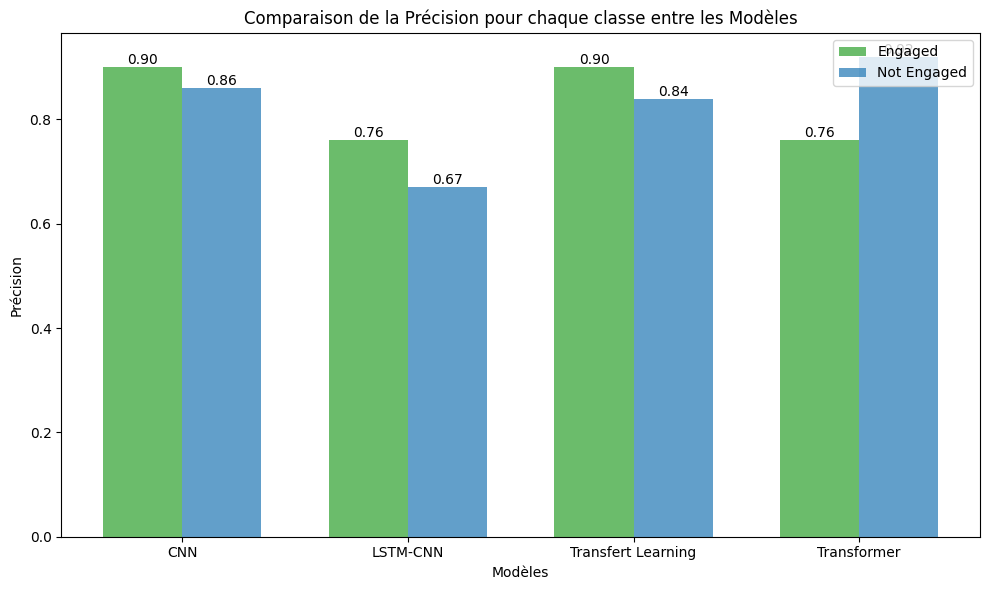

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Noms des modèles
model_names = ['CNN', 'LSTM-CNN', 'Transfert Learning', 'Transformer']

# Valeurs de précision pour chaque classe et chaque modèle (exemple de valeurs)
precision_engaged = [0.90, 0.76, 0.90, 0.76]  # Précision pour la classe Engaged
precision_not_engaged = [0.86, 0.67, 0.84, 0.92]  # Précision pour la classe Not Engaged

# Largeur des barres
bar_width = 0.35
index = np.arange(len(model_names))

# Création de la figure
fig, ax = plt.subplots(figsize=(10, 6))

# --- Barres de Précision pour chaque classe ---
bars1 = ax.bar(index, precision_engaged, bar_width, label='Engaged', color='tab:green', alpha=0.7)
bars2 = ax.bar(index + bar_width, precision_not_engaged, bar_width, label='Not Engaged', color='tab:blue', alpha=0.7)

# Étiquettes et légende
ax.set_xlabel('Modèles')
ax.set_ylabel('Précision')
ax.set_title('Comparaison de la Précision pour chaque classe entre les Modèles')
ax.set_xticks(index + bar_width / 2)  # Position des labels des modèles
ax.set_xticklabels(model_names)
ax.legend()

# Ajouter les valeurs au-dessus des barres
for bar in bars1:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom')

for bar in bars2:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Affichage du graphique
plt.tight_layout()
plt.show()
